In [1]:
from IPython.core.display import HTML
css_file = './custom.css'
#HTML(open(css_file, "r").read())

###### Content provided under a Creative Commons Attribution license, CC-BY 4.0; code under MIT License. (c)2015 [David I. Ketcheson](http://davidketcheson.info)

##### Version 0.3 - May 2022

In [2]:
import numpy as np
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import HTML
font = {'size'   : 15}
matplotlib.rc('font', **font)

# The FFT, aliasing, and filtering

Welcome to lesson 3.  Here we'll learn about the Fast Fourier Transform, which we've been using all along.  We'll also learn about a numerical pathology of pseudospectral methods (known as *aliasing*) and one way to avoid it (known as *filtering* or *dealiasing*).

## The fast Fourier transform

We won't go into great detail regarding the FFT algorithm, since there is already an excellent explanation of the Fast Fourier Transform in Jupyter Notebook form available on the web:

- [Understanding the FFT Algorithm](https://jakevdp.github.io/blog/2013/08/28/understanding-the-fft/) by Jake Vanderplas

Suffice it to say that the FFT is a fast algorithm for computing the discrete Fourier transform (DFT):

$$
\hat{u}_\xi = \sum_{j=0}^{m-1} u_j e^{-2\pi i \xi j/m}
$$

or its inverse.  The DFT, as we know, is linear and can be computed by multiplying $u$ by a certain $m\times m$  dense matrix $F$.  Multiplication by a dense matrix requires ${\mathcal O}(m^2)$ operations.
The FFT is a shortcut to compute that matrix-vector product in just ${\mathcal O}(m \log m)$ operations by taking advantage of the special structure of $F$.  

This is very important for pseudospectral methods, since most of the computational work occurs in computing the Fourier transform and its inverse.  It's also important that we make use of a compiled version of the FFT, since native Python code is relatively slow.  The `np.fft` function is an interface to a compiled FFT library.

### Ordering of wavenumbers in FFT output
The vector returned by `np.fft` contains the Fourier coefficients of $u$ corresponding to the wavenumbers

$$
\frac{2\pi}{L} \{-m/2, -m/2 + 1, \dots, m/2 - 1\}.
$$

However, for computational efficiency the output vector does not use the natural ordering above.  The ordering it uses can be obtained with the following command.

In [3]:
m = 16
L = 2*np.pi

xi=np.fft.fftfreq(m)*m/(L/(2*np.pi))
print(xi)

[ 0.  1.  2.  3.  4.  5.  6.  7. -8. -7. -6. -5. -4. -3. -2. -1.]


As you can see, the return vector starts with the nonnegative wavenumbers, followed by the negative wavenumbers.  It may seem strange to you that the range of wavenumbers returned is not symmetric; in the case above, it includes $-8$ but not $+8$.  This apparent asymmetry can be explained once one understands the phenomenon known as *aliasing*.

## Aliasing

A numerical grid has a limited resolution.  If you try to represent a rapidly-oscillating function with relatively few grid points, you will observe an effect known as **aliasing**.  This naturally limits the range of frequencies that can be modelled on a given grid.  It can also lead to instabilities in pseudospectral simulations, when generation of high frequencies leads to buildup of lower-frequency energy due to aliasing.

The code below plots a sine wave of a given wavenumber $\xi$, along with its representation on a grid with $m$ points.  Try changing $\xi$ and notice how for $  |\xi| \ge m$ the function looks like a lower-frequency mode.

In [4]:
from ipywidgets import widgets
from ipywidgets import interact, interactive

def plot_sine(wavenumber=4,grid_points=12,plot_sine=True):
    "Plot sin(2*pi*p), sampled at m equispaced points."
    x  = np.linspace(0,1,grid_points+1); # grid
    xf = np.linspace(0,1,1000) # fine grid
    y  = np.sin(wavenumber*np.pi*x)
    yf = np.sin(wavenumber*np.pi*xf)
    fig = plt.figure(figsize = (8, 6));
    ax = fig.add_subplot(1,1,1);
    if plot_sine:
        ax.plot(xf, yf, 'r-', linewidth=2);
    ax.plot(x,  y,  'o-', lw=2)

interact(plot_sine, wavenumber=(-30,30,1), 
         grid_points=(5, 16, 1));

interactive(children=(IntSlider(value=4, description='wavenumber', max=30, min=-30), IntSlider(value=12, descr…

### Exercise

Try to answer the questions below with pencil and paper; then check them by modifying the code above.

1. For a given number of grid points $m$, which wavenumbers $p$ will be aliased to the $p=0$ mode?  Which will be aliased to $p=1$?  Can you explain why?
2. What is the highest frequency mode that can be represented on a given grid?

You will find that the sampled frequencies (i.e., the set of values on the grid) repeat in the pattern illustrated below:

![test](./aliasing_frequencies.png)

For the points labeled with the same color, the values of the function when sampled on the grid are identical.  For the points with the corresponding lighter color, the values on the grid are the same except for multiplication by $-1$.

## Aliasing as a source of numerical instability

As we have seen, aliasing means that wavenumbers of magnitude greater than $\pi m/L$ are incorrectly represented as lower wavenumbers on a grid with $m$ points.  This suggests that we shouldn't allow larger wavenumbers in our numerical solution.  For linear problems, this simply means that we should represent the initial condition by a truncated Fourier series containing modes with wavenumbers less than $\pi m/L$.  This happens naturally when we sample the function at the grid points.  As we evolve in time, higher frequencies are not generated due to the linearity of the problem.

Nonlinear problems are a different story.  Let's consider what happens when we have a quadratic term like $u^2$, as in Burgers' equation.  In general, if the grid function $u$ contains wavenumbers up to $\pi m/L$, then $u^2$ contains frequencies up to $2 \pi m/L$.  So each time we compute this term, we generate high frequencies that get aliased back to lower frequencies on our grid.  Clearly this has nothing to do with the correct mathematical solution and will lead to errors.  Even worse, this aliasing effect can, as it is repeated at every step, lead to an instability that causes the numerical solution to blow up.

$$
\newcommand{\F}{\mathcal F}
\newcommand{\Finv}{{\mathcal F}^{-1}}
$$
## An illustration of aliasing instability: the Korteweg-de Vries equation

To see aliasing in practice, we'll consider the KdV equation, which describes certain kinds of water waves:


$$
u_t = -u u_x - u_{xxx}
$$

A natural pseudospectral discretization is obtained if we compute the spatial derivatives via

\begin{align}
u_x & = \Finv(i\xi \F(u)) \\
u_{xxx} & = \Finv(-i\xi^3 \F(u)).
\end{align}
This gives
$$
U'(t) = -D[U] \Finv(i\xi \F(U)) - \Finv(-i\xi^3 \F(U)).
$$

This is identical to our discretization of Burgers' equation, except that now we have a third-derivative term.  In Fourier space, the third derivative gives a purely imaginary factor, which -- like the first derivative -- causes the solution to travel over time.  Unlike the first derivative, the third derivative term causes different wavenumber modes to travel at different speeds; this is referred to as *dispersion*.

The largest-magnitude eigenvalues of the Jacobian for this semi-discretization are related to the 3rd-derivative term.  If we consider only that term, the eigenvalues are

$$-i \xi^3$$

where $\xi$ lies in the range $(-m/2, m/2)$.  So we need the time step to satisfy $\Delta t (m/2)^3 \in S$, where $S$ is the region of absolute stability of a given time integrator.

For this example we'll use a 3rd-order Runge-Kutta method:

In [70]:
m=128
rkmA = np.array([[0.0,0.0,0.0],[1.0,0.0,0.0],[0.25,0.25,0.0]])
b = np.array([1.0/6.0,1.0/6.0,2.0/3.0])
F = np.zeros([3,m])
s=3

def rk3(u,xi,rhs,rlx=False):
    
    y2 = u + dt*rhs(u,xi)
    y3 = 0.75*u + 0.25*(y2 + dt*rhs(y2,xi))
    
    diff = np.dot((1.0/6.0)*rhs(y2,xi),(y2-u))+np.dot((2.0/3.0)*rhs(y3,xi),(y3-u))
    term = dt*((1.0/6.0)*rhs(u,xi)+(1.0/6.0)*rhs(y2,xi)+(2.0/3.0)*rhs(y3,xi))
    
    den = np.dot(term,term)
    F[0] = rhs(u,xi)
    F[1] = rhs(y2,xi)
    F[2] = rhs(y3,xi)
    
    if rlx:
        numer = 2*sum(b[i]*rkmA[i,j]*np.dot(F[i],F[j]) \
                                for i in range(s) for j in range(s))
        denom = sum(b[i]*b[j]*np.dot(F[i],F[j]) for i in range(s) for j in range(s))
        if denom != 0:
            rlx_gamma = numer/denom
        else:
            rlx_gamma = 1.0
        #rlx_gamma = 2.0*dt*diff/den
    else:
        rlx_gamma=1.0
    
    u_new = u+rlx_gamma*(term)
    
    print("RLX",rlx_gamma,2.0*dt*diff/den,den/(dt*dt),denom)
    return u_new,rlx_gamma

Let's check the size of the imaginary axis interval contained in this method's absolute stability region:

In [71]:
from nodepy import rk
ssp33 = rk.loadRKM('SSP33')
print(ssp33.imaginary_stability_interval())
(ssp33.main_method)

1.7320508075688776


Exception: Inconsistent dimensions of Shu-Osher arrays

Now we'll go ahead and implement our solution, making sure to set the time step according to the condition above.

In [72]:
def rhs(u, xi, equation='Burgers'):
    uhat = np.fft.fft(u)
    if equation == 'Burgers': 
        return -u*np.real(np.fft.ifft(1j*xi*uhat))# + np.real(np.fft.ifft(-xi**2*uhat))
    elif equation == 'KdV':
        return -u*np.real(np.fft.ifft(1j*xi*uhat)) - np.real(np.fft.ifft(-1j*xi**3*uhat))
    
# Grid
m = 128
L = 2.0
x = np.arange(-m/2,m/2)*(L/m)
xi = np.fft.fftfreq(m)*m*2*np.pi/L

dx = L/m


dt = 0.3*dx# 1.0*1.73/((m/2)**3)

print("dx",dx,dt)

A = 25; B = 16;

#u = 3*A**2/np.cosh(0.5*(A*(x+2.)))**2 + 3*B**2/np.cosh(0.5*(B*(x+1)))**2
#tmax = 0.006

# Try this one first:
u = np.exp(-30*(x)**2)
tmax = 2.0

uhat2 = np.abs(np.fft.fft(u))

num_plots = 50
nplt = np.floor((tmax/num_plots)/dt)
nmax = int(round(tmax/dt))

print(nmax,nplt)

fig = plt.figure(figsize=(12,8))
axes = fig.add_subplot(211)
axes2 = fig.add_subplot(212)
line, = axes.plot(x,u,lw=3)
line2, = axes2.semilogy(xi,uhat2)
xi_max = np.max(np.abs(xi))
axes2.semilogy([xi_max/2.,xi_max/2.],[1.e-6,4e8],'--r')
axes2.semilogy([-xi_max/2.,-xi_max/2.],[1.e-6,4e8],'--r')
axes.set_xlabel(r'$x$',fontsize=30)
axes2.set_xlabel(r'$\xi$',fontsize=30)
plt.tight_layout()
plt.close()


mass_ini = np.sum(np.square(np.abs(u)))

frames = [u.copy()]
tt = [0]
uuhat = [uhat2]
t=0.0
n=1
gml = []

while (t<=tmax):
    u_new,gmma = rk3(u,xi,rhs,rlx=True)

    u = u_new.copy()
    t = t + gmma*dt
    # Plotting
    if 0 == 0:
        frames.append(u.copy())
        tt.append(t)
        uhat2 = np.abs(np.fft.fft(u))
        uuhat.append(uhat2)
        gml.append(gmma)
        #print(gmma)
    n=n+1
        
mass = np.sum(np.square(np.abs(u)))

print("Mass change",(np.abs(mass-mass_ini))/mass_ini)
        
def plot_frame(i):
    line.set_data(x,frames[i])
    power_spectrum = np.abs(uuhat[i])**2
    line2.set_data(np.sort(xi),power_spectrum[np.argsort(xi)])
    axes.set_title('t= %.2e' % tt[i])
    axes.set_xlim((-1.0,1.0))
    #axes.set_ylim((-200,3000))
    
#anim = matplotlib.animation.FuncAnimation(fig, plot_frame,
 #                                         frames=len(frames), interval=100,
#                                          repeat=False)

#HTML(anim.to_jshtml())

dx 0.015625 0.0046875
427 8.0
RLX 1.0002087025693698 1.000208702569369 155.30695331828406 155.3069533182841
RLX 1.000208927524306 1.0002089275243076 155.4183690470005 155.4183690470005
RLX 1.0002094577664546 1.0002094577664546 155.64185831534834 155.64185831534837
RLX 1.000210298270581 1.0002102982705814 155.9785042175792 155.97850421757926
RLX 1.0002114569519167 1.000211456951917 156.42994904400683 156.42994904400686
RLX 1.0002129448424206 1.0002129448424202 156.9984155231688 156.99841552316883
RLX 1.0002147763406999 1.0002147763406988 157.68673596713393 157.68673596713398
RLX 1.0002169695456111 1.0002169695456091 158.49839006383215 158.49839006383218
RLX 1.0002195466872796 1.0002195466872787 159.4375523031646 159.43755230316464
RLX 1.0002225346738693 1.000222534673868 160.50915030949622 160.5091503094962
RLX 1.0002259657782264 1.000225965778226 161.71893569621432 161.71893569621432
RLX 1.000229878495997 1.0002298784959949 163.07356947656805 163.07356947656803
RLX 1.0002343186165144 1

(433,)


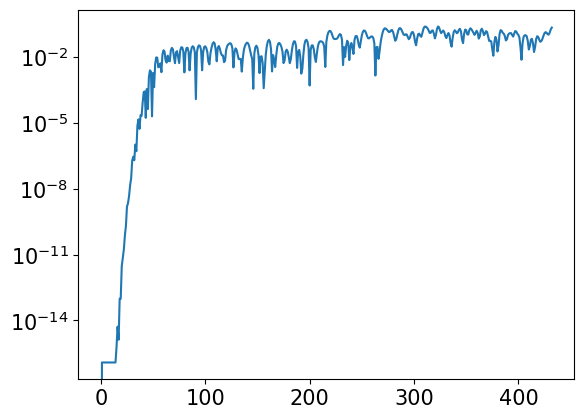

In [49]:
mass = np.array([np.sum(np.square(np.abs(u))) for u in frames])

print(mass.shape)
plt.yscale("log")
plt.plot(np.abs(mass-mass_ini)/mass_ini)

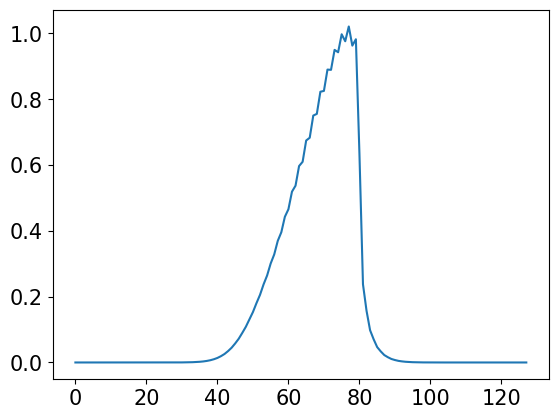

In [80]:
plt.plot(frames[-1])

In [73]:

gml

[1.000208702569369,
 1.0002089275243082,
 1.0002094577664542,
 1.0002102982705825,
 1.0002114569519163,
 1.0002129448424213,
 1.000214776340701,
 1.0002169695456091,
 1.0002195466872785,
 1.0002225346738673,
 1.000225965778227,
 1.0002298784959984,
 1.0002343186165128,
 1.0002393405605754,
 1.0002450090563972,
 1.0002514012490764,
 1.0002586093666284,
 1.0002667440898647,
 1.0002759389069242,
 1.000286356071904,
 1.0002981938855755,
 1.000311692202947,
 1.0003271429734368,
 1.0003449414992787,
 1.0003656463848054,
 1.0003897853838715,
 1.0004174836166857,
 1.0004495153322759,
 1.0004903370867968,
 1.0005455465592155,
 1.0006063861201369,
 1.0006481565927257,
 1.0006892077288438,
 1.0008441985530032,
 1.001171214920037,
 1.0013877287237323,
 1.001070411083098,
 1.000607520847451,
 1.0013718911432203,
 1.003627757122764,
 1.0050176386110234,
 1.0024202624976017,
 0.9979284290788834]

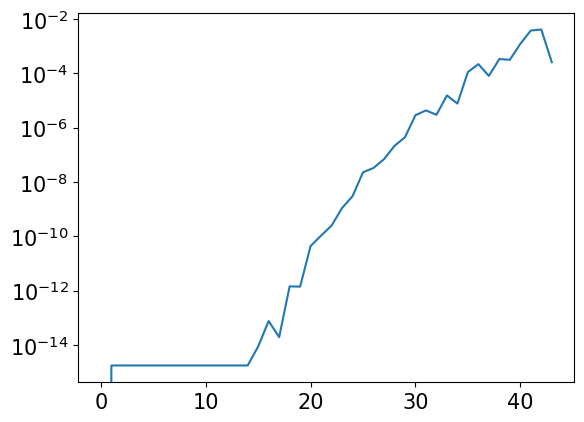

In [76]:
plt.plot(np.abs(mass-mass_ini))
plt.yscale("log")

In the output, we're plotting the solution (top plot) and its power spectrum ($|\hat{u}|^2$) (bottom plot).  There are a lot of interesting things to say about the solution, but for now let's focus on the Fourier transform.  Notice how the amount of energy in the high wavenumbers present (those outside the dashed red lines) remains relatively small.  Because of this, no aliasing occurs.

Now change the code above to use only $m=128$ grid points.  What happens?

## Explanation

Here we will give a somewhat simplified explanation of the blow-up just observed.  First, this blowup has nothing to do with the absoute stability condition -- when we change $m$, the time step is automatically changed in a way that will ensure absolute stability.  If you're not convinced, try taking the time step even smaller; you will still observe the blowup.

By taking $m=128$, we cut by half the wavenumbers that can be represented on the grid.  As you can see from the plots, this means that after the solution begins to steepen, a significant amount of the energy present in the solution is in the upper half of the representable range of wavenumbers (i.e., outside the dashed red lines).  That means that the highest wavenumbers generated by the quadratic term will be aliased -- and they will be aliased back into that upper-half range.  This leads to a gradual and incorrect accumulation of high-wavenumber modes, easily visible in both plots.  Eventually the high-wavenumber modes dominate the numerical solution and lead to blowup.

For a detailed discussion of aliasing instabilities, see Chapter 11 of John Boyd's "Chebyshev and Fourier Spectral Methods".

## Filtering

How can we avoid aliasing instability?  The proper approach is to ensure that the solution is well resolved, so that the instability never appears.  However, this may entail a very substantial computational cost.  One way to ensure stability even if the solution is underresolved is by *filtering*, which is also known as *dealiasing*.  In general it is unwise to rely on filtering, since it can mask the fact that the solution is not resolved (and hence  inaccurate).  But understanding filtering can give a bit more insight into aliasing instability itself.

At the most basic level, filtering means removing the modes that lead to aliasing.  This can be done by damping the high wavenumbers or simply zeroing them when computing the $(u^2)_x$ term.  The obvious approach would be to filter the upper half of all wavenumbers, but this is overkill.  In fact, it is sufficient to filter only the uppermost third.  To see why, notice that the aliased modes resulting from the lower two-thirds will appear in the uppermost third of the range of modes, and so will be filtered at the next step.

A simple 2/3 filter is implemented in the code below.

In [21]:
def rhs(u, xi, filtr, equation='Burgers'):
    uhat = np.fft.fft(u)
    if equation == 'Burgers': 
        return -u*np.real(np.fft.ifft(1j*xi*uhat*filtr)) \
                + np.real(np.fft.ifft(-xi**2*uhat))
    elif equation == 'KdV':
        return -u*np.real(np.fft.ifft(1j*xi*uhat*filtr)) \
                - np.real(np.fft.ifft(-1j*xi**3*uhat))
    
def rk3(u,xi,rhs,filtr):
    y2 = u + dt*rhs(u,xi,filtr)
    y3 = 0.75*u + 0.25*(y2 + dt*rhs(y2,xi,filtr))
    u_new = 1./3 * u + 2./3 * (y3 + dt*rhs(y3,xi,filtr))
    return u_new
    
# Grid
m = 128
L = 2*np.pi
x = np.arange(-m/2,m/2)*(L/m)
xi = np.fft.fftfreq(m)*m*2*np.pi/L
filtr = np.ones_like(xi)
xi_max = np.max(np.abs(xi))
filtr[np.where(np.abs(xi)>xi_max*2./3)] = 0.

dt = 1.73/((m/2)**3)

A = 25; B = 16;
u = 3*A**2/np.cosh(0.5*(A*(x+2.)))**2 + 3*B**2/np.cosh(0.5*(B*(x+1)))**2
#u = 1500*np.exp(-10*(x+2)**2)
tmax = 0.012

uhat2 = np.abs(np.fft.fft(u))

num_plots = 200
nplt = np.floor((tmax/num_plots)/dt)
nmax = int(round(tmax/dt))

fig = plt.figure(figsize=(12,8))
axes = fig.add_subplot(211)
axes2 = fig.add_subplot(212)
line, = axes.plot(x,u,lw=3)
line2, = axes2.semilogy(xi,uhat2)
axes2.semilogy([xi_max/2.,xi_max/2.],[1.e-6,4e8],'--r')
axes2.semilogy([-xi_max/2.,-xi_max/2.],[1.e-6,4e8],'--r')
axes.set_xlabel(r'$x$',fontsize=30)
axes2.set_xlabel(r'$\xi$',fontsize=30)
plt.tight_layout()
plt.close()

frames = [u.copy()]
tt = [0]
uuhat = [uhat2]

for n in range(1,nmax+1):
    u_new = rk3(u,xi,rhs,filtr)

    u = u_new.copy()
    t = n*dt
    # Plotting
    if np.mod(n,nplt) == 0:
        frames.append(u.copy())
        tt.append(t)
        uhat2 = np.abs(np.fft.fft(u))
        uuhat.append(uhat2)
        
def plot_frame(i):
    line.set_data(x,frames[i])
    power_spectrum = np.abs(uuhat[i])**2
    line2.set_data(np.sort(xi),power_spectrum[np.argsort(xi)])
    axes.set_title('t= %.2e' % tt[i])
    axes.set_xlim((-np.pi,np.pi))
    axes.set_ylim((-100,3000))
    
anim = matplotlib.animation.FuncAnimation(fig, plot_frame,
                                   frames=len(frames), interval=20)

HTML(anim.to_jshtml())

/var/folders/ll/kxnszbbj3b1bqwnlk_bqpjl8ffbpq7/T/ipykernel_48107/3779455725.py:4: RuntimeWarning: overflow encountered in multiply
  return -u*np.real(np.fft.ifft(1j*xi*uhat*filtr)) \


Notice how the solution remains stable, but small wiggles appear throughout the domain.  These are a hint that something is not sufficiently resolved.

## Exercises
The examples we have looked at behave in a way that agrees with the ideas that have been presented here.  However, the stability of nonlinear pseudospectral PDE discretizations is complicated, and it's easy to find examples that aren't fully explained by the discussion above.  You can explore this by experiments like the following.

1.  Try decreasing $m$ even further in the example above.  You may find that the solution blows up for some values.  Can you prevent this by adjusting $\Delta t$?  Can you prevent it by filtering more wavenumbers?

2.  Try solving the inviscid Burgers' equation with a 2/3 filter.  For this problem, there is no value of $m$ large enough to resolve the gradients that appear, since the gradient blows up in finite time.  After the blowup time, traditionally one employs the notion of "vanishing viscosity weak solutions" in which a discontinuous solution is acceptable if it is given by the limit of solutions of
$$
u_t + uu_x = \epsilon u_{xx}
$$
as $\epsilon \to 0$.  By using filtering, can you obtain such solutions?